# Msc. Data Science Group Project (32252)
## The impact of socio-economic factors on gambling behaviour in England
### Team : Meta Four
### Code Part 1: Data collection, data cleaning and exploratory data analysis
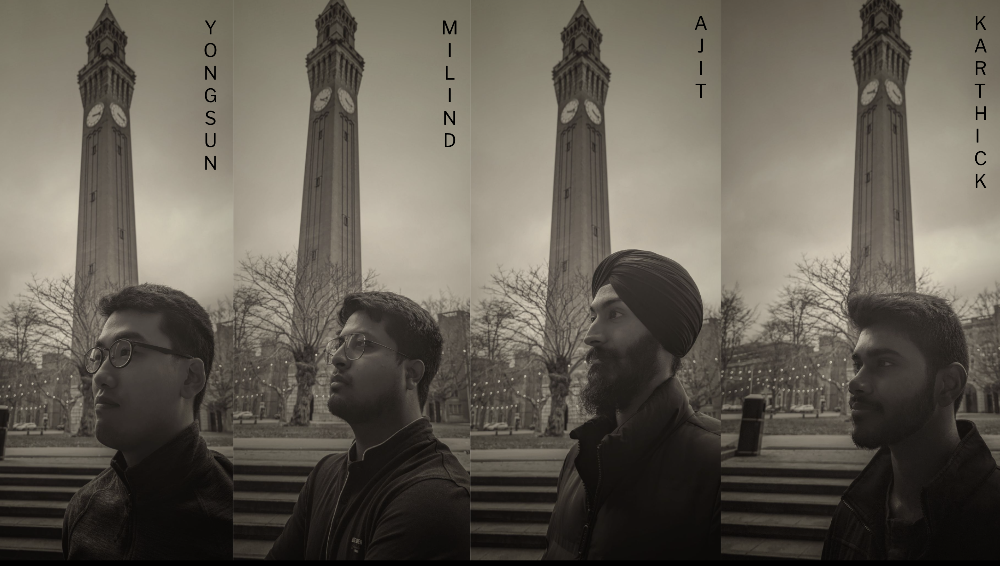

## i) Pip install packages

In [66]:
%%capture
!pip install geojson-rewind
!pip install xlrd
!pip install openpyxl
!pip install geojson-rewind
!pip install squarify

## ii) Importing all relevant libraries

In [67]:
# Standard python libraries
import numpy as np
import pandas as pd

# for visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import squarify

# for data retrieval
import json

# miscellaneous
import openpyxl
import xlrd

import plotly.io as pio
pio.renderers.default='notebook'

## 1) Data collection and cleaning

### 1.1) Gambling by income group dataset

In [68]:
# import the data
income_data = pd.read_excel("data/gambling_by_income_group.xlsx",sheet_name="3.2")

# extract the gambling spending data from the dataframe
spending = income_data.loc[283]
spending = spending.loc["Unnamed: 4":"Unnamed: 13"]
spending = spending.reset_index(drop=True)

# create a series of corresponding x values (decile groups)
labels = ["Lowest ten percent","Second decile group","Third decile group","Fourth decile group","Fifth decile group","Sixth decile group","Seventh decile group","Eighth decile group","Ninth decile group","Highest ten percent"]
labels = pd.Series(labels)
labels = labels.reset_index(drop=True)

# combine both the x (decile groups) and y (gambling spending) into one dataframe
gambling_by_income = pd.concat([labels,spending],axis=1)

# Rename the columns of the dataframe and set the index to the decile groups
gambling_by_income = gambling_by_income.rename(columns={283:"Average weekly household expenditure (%) on gambling",0:"Disposable income decile group"})
gambling_by_income = gambling_by_income.set_index("Disposable income decile group")

# Display
print(gambling_by_income)
%store gambling_by_income

                               Average weekly household expenditure (%) on gambling
Disposable income decile group                                                     
Lowest ten percent                                                            0.4  
Second decile group                                                           0.3  
Third decile group                                                            0.2  
Fourth decile group                                                           0.2  
Fifth decile group                                                            0.3  
Sixth decile group                                                            0.3  
Seventh decile group                                                          0.2  
Eighth decile group                                                           0.3  
Ninth decile group                                                            0.2  
Highest ten percent                                                         

Text(0.5, 0, 'Disposable income group')

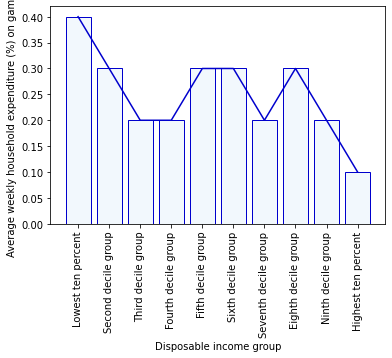

In [69]:
# plotting the gambling by income data

sns.barplot(x=gambling_by_income.index,y=gambling_by_income["Average weekly household expenditure (%) on gambling"],color="aliceblue",edgecolor="mediumblue")
plt.xticks(rotation=90)
sns.lineplot(x=gambling_by_income.index,y=gambling_by_income["Average weekly household expenditure (%) on gambling"],color="mediumblue")
plt.xlabel("Disposable income group")

### 1.2) Gambling by age group dataset

             Average weekly household expenditure (%) on gambling
Age group                                                        
Less than 30                                           0.101317  
30-49                                                  0.142323  
50-64                                                  0.287411  
65-74                                                  0.339071  
75 or over                                             0.364721  
Stored 'gambling_by_age' (DataFrame)


<Axes: xlabel='Age group', ylabel='Average weekly household expenditure (%) on gambling'>

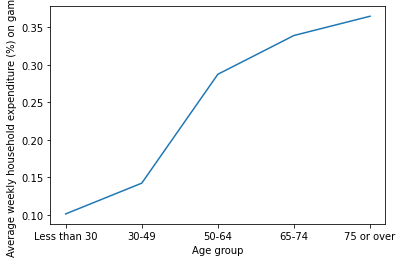

In [70]:
# import the data
age_data = pd.read_excel("data/gambling_by_income_group.xlsx",sheet_name="A11")

# extract the gambling spending data from the dataframe
ages = age_data.loc[262]
ages = ages.loc["Unnamed: 4":"Unnamed: 8"]
ages = ages.reset_index(drop=True)

# extract the total weekly expenditure from the dataframe
totalexp = age_data.loc[360]
totalexp = totalexp.loc["Unnamed: 4":"Unnamed: 8"]
totalexp = totalexp.reset_index(drop=True)

# calculate weekly spending as a %
percent = (ages/totalexp)*100

# create a series of corresponding x values (age groups)
labels = ["Less than 30","30-49","50-64","65-74","75 or over"]
labels = pd.Series(labels)
labels = labels.reset_index(drop=True)

# combine both the x (age groups) and y (gambling spending) into one dataframe
gambling_by_age = pd.concat([labels,percent],axis=1)

# Rename the columns of the dataframe and set the index to the age groups
gambling_by_age = gambling_by_age.rename(columns={1:"Average weekly household expenditure (%) on gambling",0:"Age group"})
gambling_by_age = gambling_by_age.set_index("Age group")

# Display
print(gambling_by_age)
%store gambling_by_age

# plot
gambling_by_age = gambling_by_age.reset_index()
sns.lineplot(data=gambling_by_age,x="Age group",y="Average weekly household expenditure (%) on gambling")

### 1.3) Gambling by region dataset

In [71]:
# Import and clean the gambling region dataset

# import the data
region_data = pd.read_excel("data/gambling_by_region.xlsx",sheet_name="A35")

# extract the gambling spending data from the dataframe
region = region_data.loc[288]
region = region.loc["Unnamed: 6":"Unnamed: 17"]
region = region.reset_index(drop=True)

# extract the total weekly expenditure from the dataframe
exp = region_data.loc[391]
exp = exp.loc["Unnamed: 6":"Unnamed: 17"]
exp = exp.reset_index(drop=True)

# calculate % of weekly spending
gambling_spend = (region/exp)*100

# create a series of corresponding x values (regions)
labels = ["North East","North West","Yorkshire and the Humber","East Midlands","West Midlands","East","London","South East","South West","Wales","Scotland","Northern Ireland"]
labels = pd.Series(labels)
labels = labels.reset_index(drop=True)

# combine both the x (regions) and y (gambling spending) into one dataframe
gambling_by_region = pd.concat([labels,gambling_spend],axis=1)

# Rename the columns of the dataframe and set the index to the regions
gambling_by_region = gambling_by_region.rename(columns={1:"Average weekly household expenditure (%) on gambling",0:"Region"})
gambling_by_region = gambling_by_region.set_index("Region")
gambling_by_region["Average weekly household expenditure (%) on gambling"] = gambling_by_region["Average weekly household expenditure (%) on gambling"].astype(float).round(2)

# display
print(gambling_by_region)
%store gambling_by_region

                          Average weekly household expenditure (%) on gambling
Region                                                                        
North East                                                             0.72   
North West                                                             0.37   
Yorkshire and the Humber                                               0.44   
East Midlands                                                          0.46   
West Midlands                                                          0.39   
East                                                                   0.35   
London                                                                 0.22   
South East                                                             0.35   
South West                                                             0.24   
Wales                                                                  0.35   
Scotland                                            

In [72]:
# plot gambling by region

uk_regions = json.load(open("data/uk_regions.geojson","r"))

from geojson_rewind import rewind
uk_regions = rewind(uk_regions, rfc7946=False)

region_id_map = {}
for feature in uk_regions["features"]:
    feature["id"] = feature["properties"]["objectid"]
    region_id_map[feature["properties"]["rgn19nm"]] = feature["id"]

gambling_by_region = gambling_by_region["Average weekly household expenditure (%) on gambling"].astype(float)
gambling_by_region = gambling_by_region.reset_index()
gambling_by_region["id"] = gambling_by_region["Region"].apply(lambda x:region_id_map[x])

fig = px.choropleth(gambling_by_region,
                    locations="id",
                    geojson=uk_regions,
                    scope="europe",
                    color="Average weekly household expenditure (%) on gambling",
                    color_continuous_scale=["yellow","orange","red"])
fig.update_geos(fitbounds="locations",visible=False)
fig.show("notebook")

### 1.4) Unemployment by region dataset

In [73]:
# Import and clean the gambling by unemployment dataset

# import the data
unemployment_data = pd.read_excel("data/gambling_unemployment.xlsx")

# extract the unemployment data
unemployment = unemployment_data.iloc[:,4]
unemployment = unemployment[4:16]
unemployment = unemployment.reset_index(drop=True)

# extract the region data
region = unemployment_data["Unnamed: 1"]
region = region[4:16]
region = region.reset_index(drop=True)

# combine both into one dataframe
gambling_by_unemployment = pd.concat([region,unemployment],axis=1)

# rename columns dataframe
gambling_by_unemployment = gambling_by_unemployment.rename(columns={"Unnamed: 1":"Region","Unnamed: 4":"Unemployment rate (%)"})
gambling_by_unemployment = gambling_by_unemployment.set_index("Region")

print(gambling_by_unemployment)
%store gambling_by_unemployment

                         Unemployment rate (%)
Region                                        
North East                                 4.1
North West                                 3.7
Yorkshire and the Humber                   3.2
East Midlands                              3.5
West Midlands                              4.5
East                                       3.8
London                                     4.5
South East                                 3.8
South West                                 2.3
Wales                                      3.5
Scotland                                   3.1
Northern Ireland                           2.4
Stored 'gambling_by_unemployment' (DataFrame)


In [74]:
# Plotting unemployment statistics by region

uk_regions = json.load(open("data/uk_regions.geojson","r"))

from geojson_rewind import rewind
uk_regions = rewind(uk_regions, rfc7946=False)

region_id_map = {}
for feature in uk_regions["features"]:
    feature["id"] = feature["properties"]["objectid"]
    region_id_map[feature["properties"]["rgn19nm"]] = feature["id"]

gambling_by_unemployment = gambling_by_unemployment["Unemployment rate (%)"].astype(float)
gambling_by_unemployment = gambling_by_unemployment.reset_index()
gambling_by_unemployment["id"] = gambling_by_unemployment["Region"].apply(lambda x:region_id_map[x])

fig = px.choropleth(gambling_by_unemployment,
                    locations="id",
                    geojson=uk_regions,
                    scope="europe",
                    color="Unemployment rate (%)",
                    color_continuous_scale=["yellow","orange","red"])
fig.update_geos(fitbounds="locations",visible=False)
fig.show("notebook")

### 1.5) Gambling yield (online and in-person) dataset

In [75]:
# Import and clean the industry stats dataset

#import the data from the dataset
premises_data = pd.read_excel("data/Industry stats for gambling.xlsx",sheet_name="1")

#extracting the data containing the required industry statistics (remote and non-remote)
premises = premises_data.iloc[8:21,0:13]

#renaming the columns of the dataframe
premises.columns= [
    "Reporting Period", 
    "Overall Total",
    "Percentage Change",
    "Total excluding National Lotteries",
    "arcades_non_remote",
    "betting_non_remote",	
    "bingo_non_remote",
    "casino_non_remote",	
    "betting_remote",	
    "bingo_remote",
    "casino_remote",
    "Lotteries Remote and Non-Remote",
    "The National Lottery Remote and Non-Remote"]

#cleaning the data by removing missing values from the premises dataframe
premises = premises.dropna(axis = 1, how = 'all')

Text(0, 0.5, 'Gambling Yield for online gambling in million pounds')

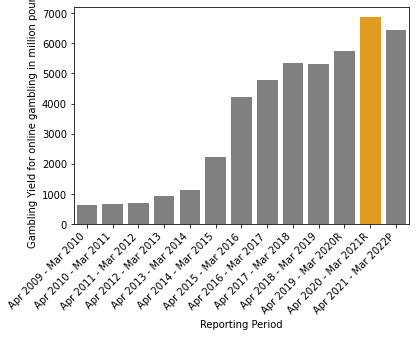

In [76]:
#Combining the various remote gambling activities into a a single entity called online gambling
premises["Online Gambling"] = premises["betting_remote"] + premises["bingo_remote"] + premises["casino_remote"]

#Highlighting the colour of the specific bar using a palette in the bar plot which indicates a sudden increase in the Online gambling activities in 2021
clr = ['orange' if (x > 6500) else 'grey' for x in premises["Online Gambling"]]

#Plotting the bar plot with reporting period as x-axis and online gambling as y-axis and providing the premises dataframe as input
sns.barplot(x='Reporting Period',y='Online Gambling',data=premises, palette=clr)

#Tilting the x-axis labels to 45 degrees for better visibility
plt.xticks(rotation = 45, ha = 'right')
plt.ylabel('Gambling Yield for online gambling in million pounds')

Text(0, 0.5, 'Gambling Yield for offline gambling in million pounds')

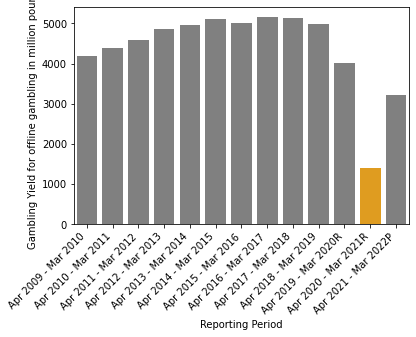

In [77]:
#Combining the various non-remote gambling activities into a a single entity called offline gambling
premises["Offline Gambling"] = premises["betting_non_remote"] + premises["bingo_non_remote"] + premises["casino_non_remote"]

#Highlighting the colour of the specific bar using a palette in the bar plot which indicates a sudden decrease in the Offline gambling activities in 2021
clr = ['grey' if (x > 1500) else 'orange' for x in premises["Offline Gambling"]]

#Plotting the bar plot with reporting period as x-axis and offline gambling as y-axis and providing the premises dataframe as input
sns.barplot(x='Reporting Period',y='Offline Gambling',data=premises, palette=clr)

#Tilting the x-axis labels to 45 degrees for better visibility
plt.xticks(rotation = 45, ha = 'right')
plt.ylabel('Gambling Yield for offline gambling in million pounds')

### 1.6) Number of gambling premises by region in UK dataset

#### 1.6.1) Gambling premises registry

In [78]:
# reading the licensed premises register dataset
premises_data = pd.read_excel("data/premises-licence-register.xlsx",sheet_name="Premises")
premises_data.head(5)

,Account Number,Account Name,Premises Activity,Local Authority,Address Line 1,Address Line 2,City,Postcode
0,1034,Power Leisure Bookmakers Limited,Betting Shop,London Borough of Tower Hamlets,1 Commercial Street,NaN,LONDON,E1 6BF
1,50352,Bet Centre (Kiosk) Limited,Betting Shop,Dudley Metropolitan Borough Council,106 Bromley,NaN,BRIERLEY HILL,DY5 4PJ
2,3266,Merkur Slots UK Limited,Adult Gaming Centre,Wakefield Metropolitan District Council,11 Beastfair,NaN,PONTEFRACT,WF18 1AL
3,44564,National Gaming Limited,NaN,NaN,123 Sherlock Street,NaN,BIRMINGHAM,B5 6NB
4,44564,National Gaming Limited,Betting Shop,Birmingham City Council,125 Sherlock Street,NaN,BIRMINGHAM,B5 6NG


In [79]:
# Extracting the no. of establishments per city
city_counts = premises_data.groupby('City').size().reset_index(name='count')

# Filtering the top20 cities by no. of establishments
top_twenty_cities = city_counts.sort_values('count', ascending=False).head(20)
top_twenty_cities

,City,count
584,LONDON,942
396,GLASGOW,283
105,BIRMINGHAM,187
574,LIVERPOOL,181
614,MANCHESTER,173
697,NOTTINGHAM,104
549,LEEDS,89
825,SHEFFIELD,82
409,GREAT YARMOUTH,80
157,BRISTOL,77


In [80]:
# The population of for top 20 cities above was obtained from an external dataset provided by ONS
# ratio of population to number of establishments was calculated 

In [81]:
#Reading the top 20 cities by (population/establishments dataset)

top_20_cities_by_pop = pd.read_excel("data/output cities with pop ratio 2.xlsx",sheet_name="output cities with pop ratio")
top_20_cities_by_pop = top_20_cities_by_pop.round(decimals=2)
print(top_20_cities_by_pop)

              City  count  Population  Count/Pop
0           LONDON    942     8961989       1.05
1          GLASGOW    283      591620       4.78
2       BIRMINGHAM    187      984333       1.90
3        LIVERPOOL    181      864122       2.09
4       MANCHESTER    173      395515       4.37
5       NOTTINGHAM    104      321500       3.23
6            LEEDS     89      455123       1.96
7        SHEFFIELD     82      685368       1.20
8   GREAT YARMOUTH     80       63434      12.61
9          BRISTOL     77      617280       1.25
10       LEICESTER     77      508916       1.51
11       EDINBURGH     72      464990       1.55
12        SKEGNESS     65       21128      30.76
13     SOUTHAMPTON     60      246201       2.44
14         CARDIFF     59      447287       1.32
15       BLACKPOOL     59      239409       2.46
16            HULL     58      261149       2.22
17       NEWCASTLE     55      192382       2.86
18       DONCASTER     55      158141       3.48
19  STOKE-ON-TRENT  

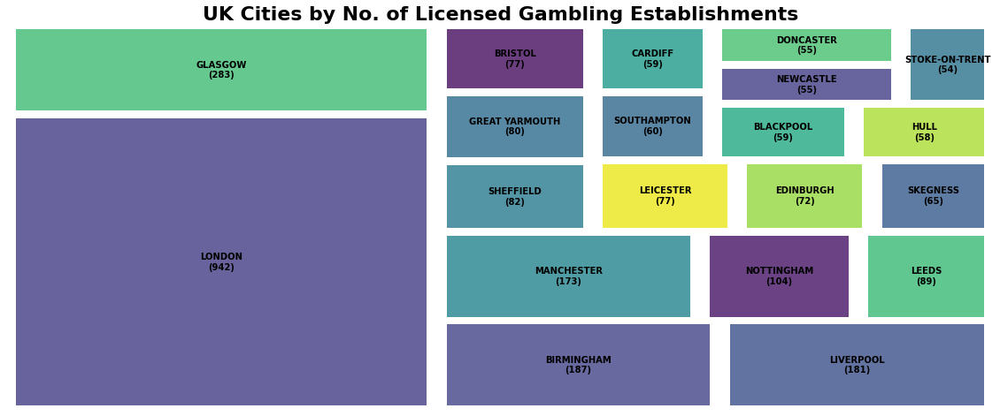

In [82]:
# Plot a tree map for the top 20 UK cities by No. of Licensed Gambling Establishments

city = top_twenty_cities['City']
count = top_twenty_cities['count']
labels = [f"{city}\n({count:,})" for city, count in zip(city, count)]
plt.figure(figsize=(20,8))

squarify.plot(sizes=count, label=labels, alpha=0.8, pad =True,text_kwargs={'fontdict': {'weight': 'bold'}})

# Set plot title
plt.title('UK Cities by No. of Licensed Gambling Establishments',fontweight='bold', fontsize=22)

# Remove plot axes
plt.axis('off')
# Show plot
plt.show()

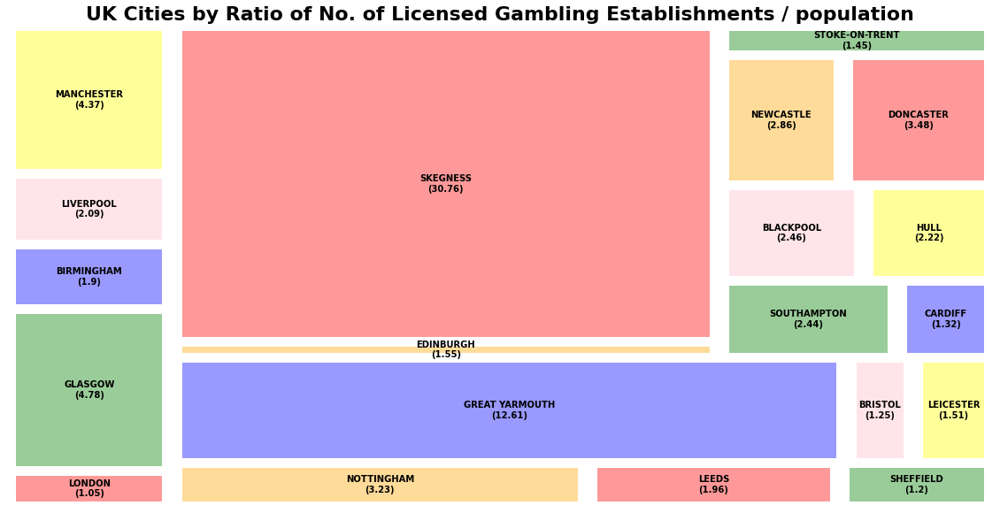

In [83]:
# plot the top 20 UK Cities by Ratio of No. of Licensed Gambling Establishments / population 

city = top_20_cities_by_pop['City']
count = top_20_cities_by_pop['Count/Pop']
labels = [f"{city}\n({count:,})" for city, count in zip(city, count)]
plt.figure(figsize=(20,10))

squarify.plot(sizes=count, label=labels, alpha=0.4, color=["red","green","blue", "pink","yellow","orange"], pad = True, text_kwargs={'fontdict': {'weight': 'bold'}})

# Set plot title
plt.title('UK Cities by Ratio of No. of Licensed Gambling Establishments / population', fontweight='bold', fontsize=22)

# Remove plot axes
plt.axis('off')
# Show plot
plt.show()